In [1]:
import sys
import os
import dlib
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.misc import imresize


**Definition of low filter for third type data**

In [2]:
def low_filter(img, loc):
    kernel = (1/9) * np.ones((3,3))
    new_img = img

    for_seq = np.arange(img.shape[1]-2) + 1
    for_seq2 = np.arange(3) -1
    
    for j in for_seq2:
        for i in for_seq:
            new_img[loc+j, i] = round(np.sum(np.sum(np.multiply(kernel,img[loc-1:loc+2, i-1:i+2]))))
        
    return new_img        


**Main**

c:\users\eodus\anaconda3\envs\opencv-env\lib\site-packages\ipykernel_launcher.py:68: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
c:\users\eodus\anaconda3\envs\opencv-env\lib\site-packages\ipykernel_launcher.py:77: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
c:\users\eodus\anaconda3\envs\opencv-env\lib\site-packages\ipykernel_launcher.py:79: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
c:\users\eodus\anaconda3\envs\opencv-env\lib\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be cre

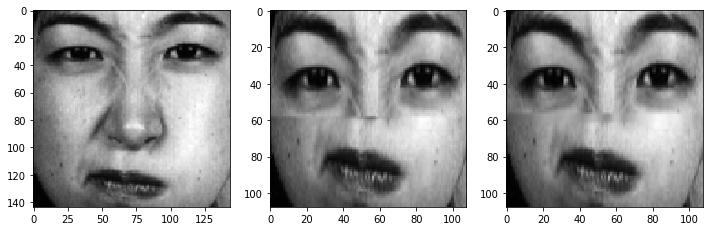

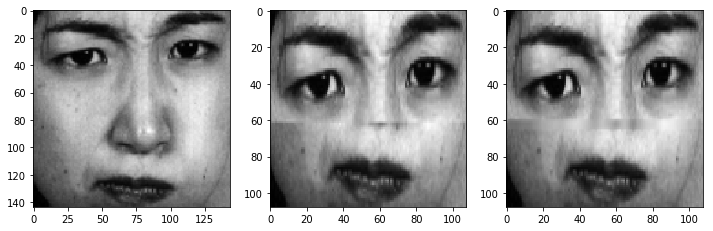

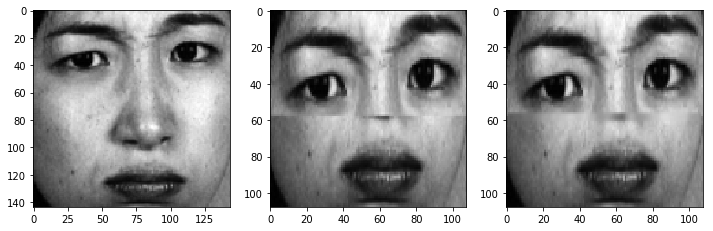

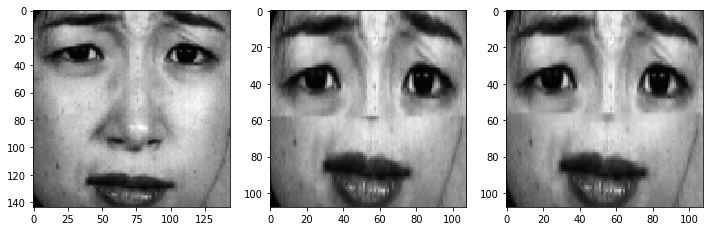

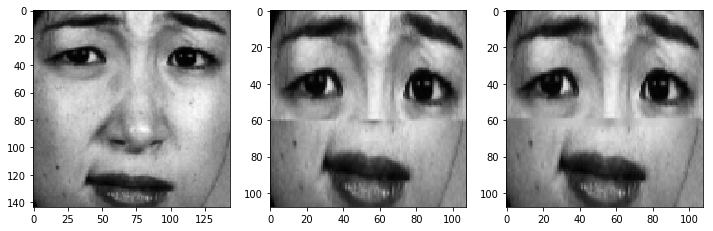

...

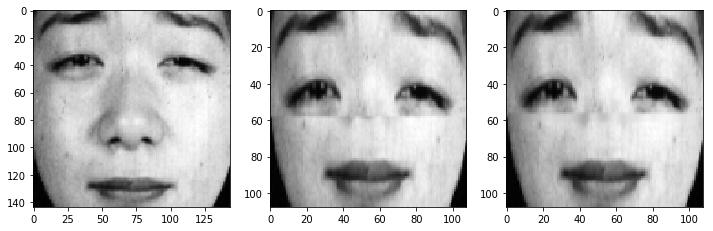

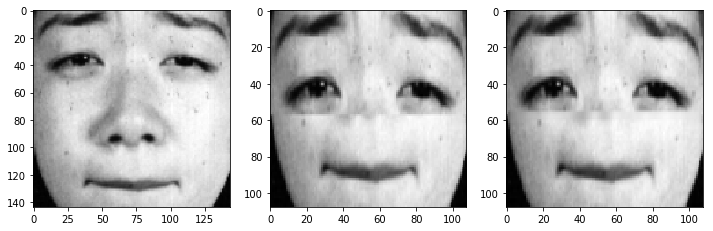

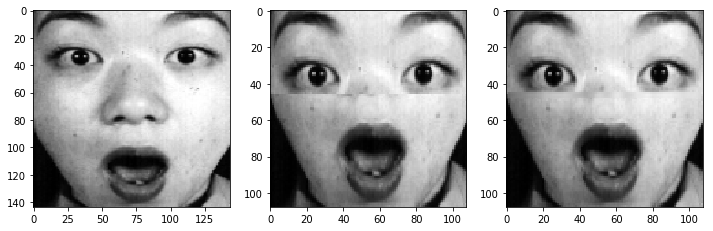

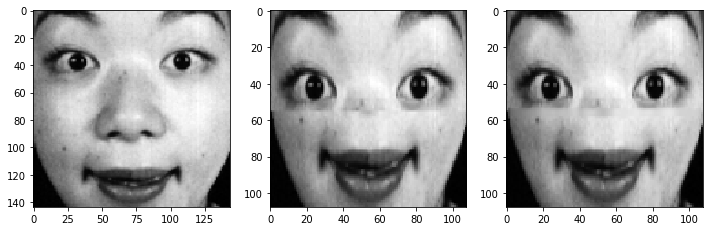

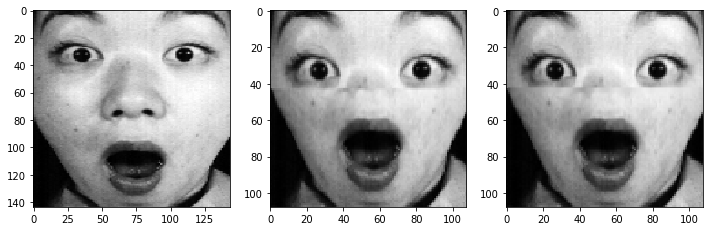

In [3]:
# Initialize

L_eyebrow = np.zeros((2,5,213)) 
R_eyebrow = np.zeros((2,5,213)) 
L_eye = np.zeros((2,6,213)) 
R_eye = np.zeros((2,6,213)) 
nose = np.zeros((2,9,213)) 
mouth = np.zeros((2,12,213))

ii = 0 # number of img
resize_cropped = np.zeros((213, 144, 144)) # Resized first type image, 144x144
resize_small_cropped = np.zeros((213, 108, 108)) # Resized second type image, 108x108
resize_small_cropped_blur = np.zeros((213, 108, 108)) # Resized third type image, 108x108
labels = np.zeros((213,7))


predictor_path = 'shape_predictor_68_face_landmarks.dat' # pre-trained face detector
faces_folder_path = './jaffe' # data location

detector = dlib.get_frontal_face_detector() # Face detector
predictor = dlib.shape_predictor(predictor_path) # Specify the salient region of face

for f in glob.glob(os.path.join(faces_folder_path, "*.tiff")):
    #### Label Assign ####
    if f.find('AN', 10) != -1:
        labels[ii,:] = [1, 0, 0, 0, 0, 0, 0]
    elif f.find('DI', 10) != -1:
        labels[ii,:] = [0, 1, 0, 0, 0, 0, 0]
    elif f.find('FE', 10) != -1:
        labels[ii,:] = [0, 0, 1, 0, 0, 0, 0]
    elif f.find('HA', 10) != -1:
        labels[ii,:] = [0, 0, 0, 1, 0, 0, 0]
    elif f.find('NE', 10) != -1:
        labels[ii,:] = [0, 0, 0, 0, 1, 0, 0]
    elif f.find('SA', 10) != -1:
        labels[ii,:] = [0, 0, 0, 0, 0, 1, 0]
    elif f.find('SU', 10) != -1:
        labels[ii,:] = [0, 0, 0, 0, 0, 0, 1]
    else: print('Error for labeling')
    
    img = cv2.imread(f,cv2.IMREAD_GRAYSCALE)
    dets = detector(img, 1) 
    
    for k, d in enumerate(dets):
        # Get the landmarks for the face
        shape = predictor(img, d) 
        for i in range(5):
            L_eyebrow[:,i,ii] = shape.part(i+17).x, shape.part(i+17).y # left eyebrow
        for i in range(5):
            R_eyebrow[:,i,ii] = shape.part(i+22).x, shape.part(i+22).y # right eyebrow
        for i in range(6):
            L_eye[:,i,ii] = shape.part(i+36).x, shape.part(i+36).y # left eye
        for i in range(6):
            R_eye[:,i,ii] = shape.part(i+42).x, shape.part(i+42).y # right eye
        for i in range(9):
            nose[:,i,ii] = shape.part(i+27).x, shape.part(i+27).y # nose
        for i in range(12):
            mouth[:,i,ii] = shape.part(i+48).x, shape.part(i+48).y # mouth
            
    # Cropping ROI        
    left_column = int(np.min(L_eyebrow[0,:,ii]))
    right_column = int(np.max(R_eyebrow[0,:,ii]))
    top_row = int(min(np.min(L_eyebrow[1,:,ii]),np.min(R_eyebrow[1,:,ii])))
    bottom_row = int(np.max(mouth[1,:,ii]))
    
    cropped_img = img[top_row:bottom_row,left_column:right_column]
    
    resize_cropped[ii,:,:] = imresize(cropped_img, [144, 144]) # Resized first type image
    
    # Get nose location to crop
    small_top_row = int(nose[1,1,ii]) 
    small_bottom_row = int(np.max(nose[1,:,ii]))

    small_cropped_img = img[top_row:small_top_row,left_column:right_column] 
    small_cropped_img = np.concatenate((small_cropped_img, img[small_bottom_row:bottom_row,left_column:right_column]),axis=0)
    
    resize_small_cropped[ii,:,:] =imresize(small_cropped_img, [108, 108]) # Resized second type image
    
    # Resized third type image
    resize_small_cropped_blur[ii,:,:] = imresize(low_filter(small_cropped_img, small_top_row - top_row), [108, 108]) 
    
    
    fig = plt.figure(figsize=(12,12))

    ax1 = fig.add_subplot(222)
    ax1 = plt.subplot(1,3,1)
    ax1.imshow(resize_cropped[ii,:,:], cmap='gray')
    

    ax1 = fig.add_subplot(222)
    ax1 = plt.subplot(1,3,2)
    ax1.imshow(resize_small_cropped[ii,:,:], cmap='gray')
    
    ax1 = fig.add_subplot(222)
    ax1 = plt.subplot(1,3,3)
    ax1.imshow(resize_small_cropped_blur[ii,:,:], cmap='gray')
        
    ii += 1

    ##### All results are attacehd at below ######